# 1. The idea behind Recurrent Neural Networks (RNNs)
* One of the most advanced algorithms in supervised deep learning 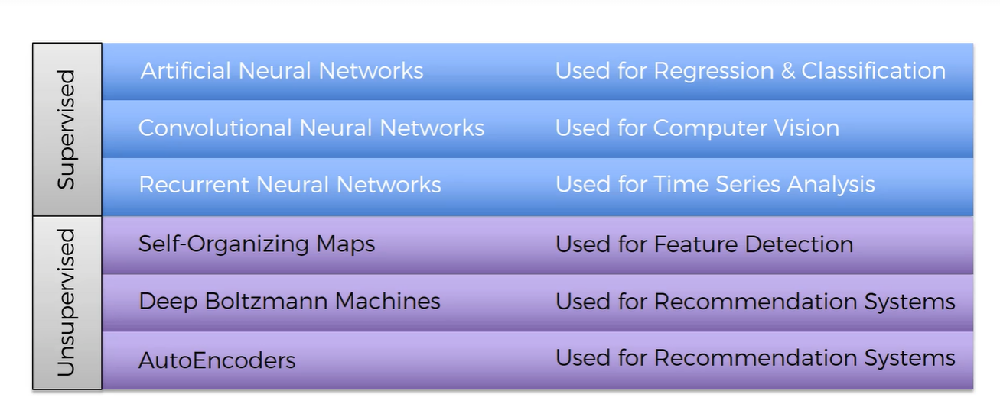
* The whole concept behind deep learning is to try and mimick the human brain, and to leverage the evolution of it as nature has gifted us
* Cerebrum has four lobes 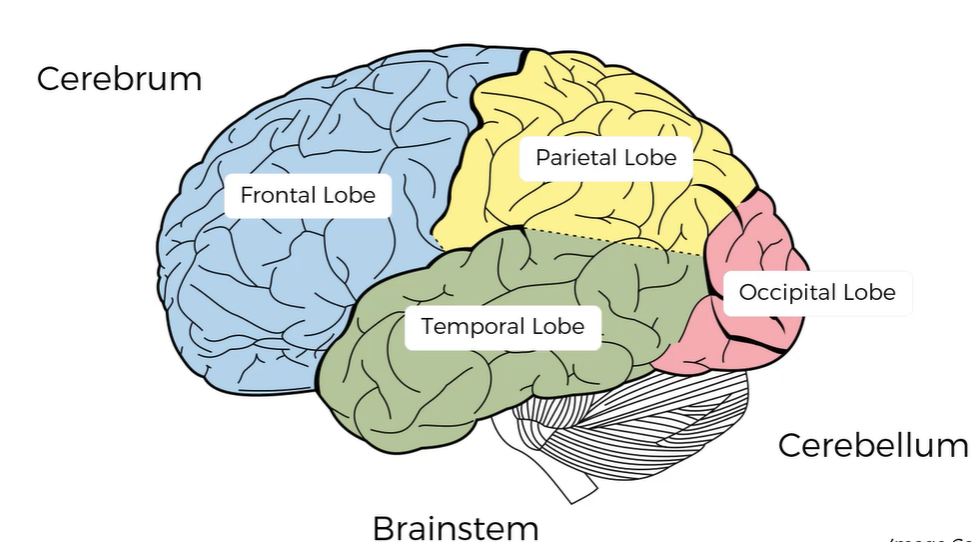
    * __Temporal Lobe is like ANN__ - ANNs can learn through prior experience and that's very valuable. Weights represents long-term memory, and it will process by neurons the same way over time. ANNs are a start to Deep Learning and they represent long-term memory, which is exactly what Temporal Lobe inside our brain is responsible for
    * __Occipital Lobe is like CNN__ which is responsible for vision/recognition of images
    * __Frontal Lobe is like RNN__ both are like short-term memory, as they remember things that just happened in the previous couple of observations and apply that knowledge going forward. Frontal Lobe is also responsible for personality, behaviour, working memory, motor cortex (planning, control and execution of voluntary movements) etc.. 
    * __Parietal Lobe__ regulates sensation and perception. It constructs a spatial coordination system to represent the world around us. We are yet to create a Neural Network which would fit into that category

# 2. How to visualise an RNN
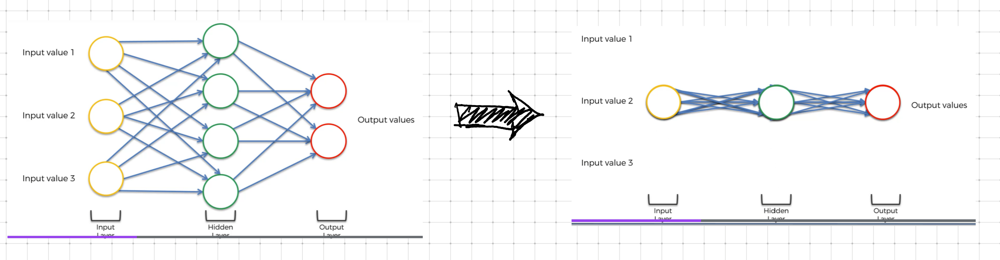
* Think of a Neural Network being visualised laterally, with all layers squashed. All input values, neurons in hidden layers and output values still exist; we are only looking at the NN from a new vantage point
* 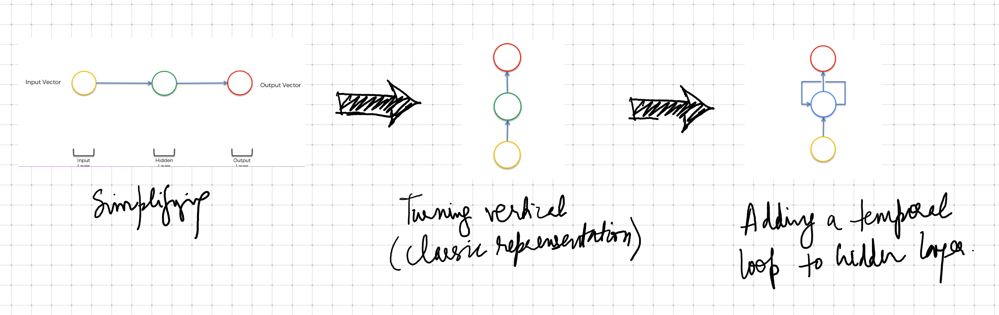
    * __The Hidden Layer not only gives output, but also feedsback into itself.__ This is the old school representation.
    * The common approach now is as below.
    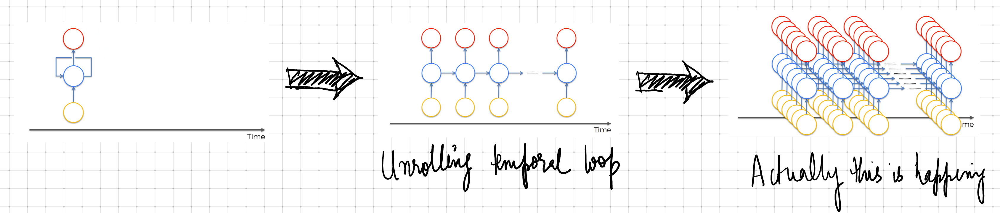
    __We have here inputs connecting to neurons, and neurons themselves connected to each other through time. So the neurons end up having short-term memory of what the previous neuron's output was. This allows neurons to pass information unto themselves in future and analyse things.

# 3. Examples of RNNs
* __One to Many__ where we have one input and multiple outputs e.g. an AI describing an image
* __Many to One__ e.g. Sentiment Analysis from a lot of text - whether the text is positive or negative and the extent of the sentiment
* __Many to Many__ e.g. Translation of a sentence 'He eats an apple' into a language which has different verb forms for different genders or running subtitles of a movie. Short term memory of the plot is needed to do that
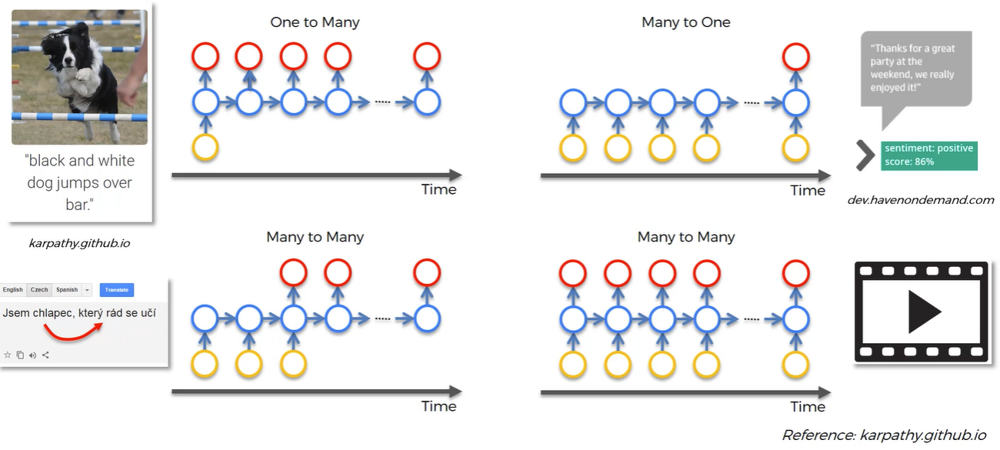

# 4. The Vanishing Gradient Problem
* If we recall the Gradient Descent, the algorithm tries to find the global minimum of Cost Function C, which is the optimal solution for Neural Network. Then through backpropagation weights are updated throughout the Neural Network 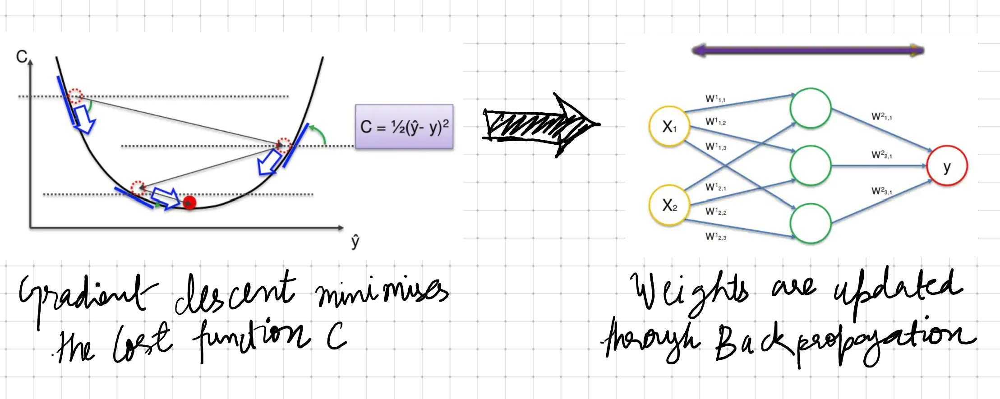
* In a Recurrent Neural Network, a similar operation occurs, information travels through time to next timeposts. Cost Function (or Error Function) is calculated at each timepost. Cost Function compares the output in red circle to the desired output during the Training phase 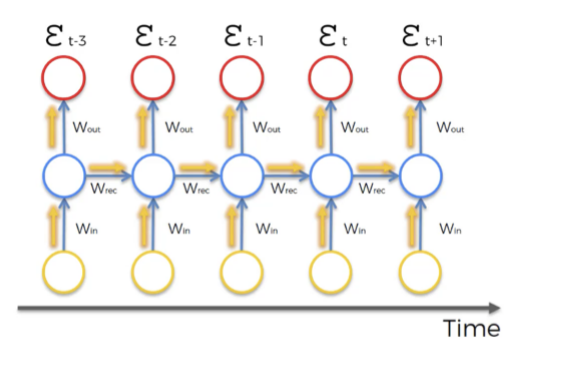
* After the cost function has been calculated at time t, it is backpropagated through the network (and through time) to update the weights of every single neuron which participated in the calculation of cost function at time t.
    * This is where the vanishing gradient problem lies: updating weights back in time. The Recurring weight (W rec)
    * When multiplication with this small W rec number occurs multiple times through the previous timeposts, an already smaller value, becomes even smaller (recall that a random weight value is chosen at the beginning and if that random W rec value is close to 0, the more we multiply back through time, the smaller this value gets)
    * This Vanishing Gradient is bad for the network because the lower the Gradient is, the harder it is for the network to update the weights. If the number of epochs is sufficiently high, we might find that the earlier timeposts turn out to not have been trained properly.
    * Another problem is that the output from these untrained weights early in the time, is also used to calculate current output. This is a vicious cycle and this renders the whole network not being trained properly.
    * If W rec is small (< 1) --> Vanishing Gradient problem
    * If W rec is large (> 1) --> Exploding Gradient problem
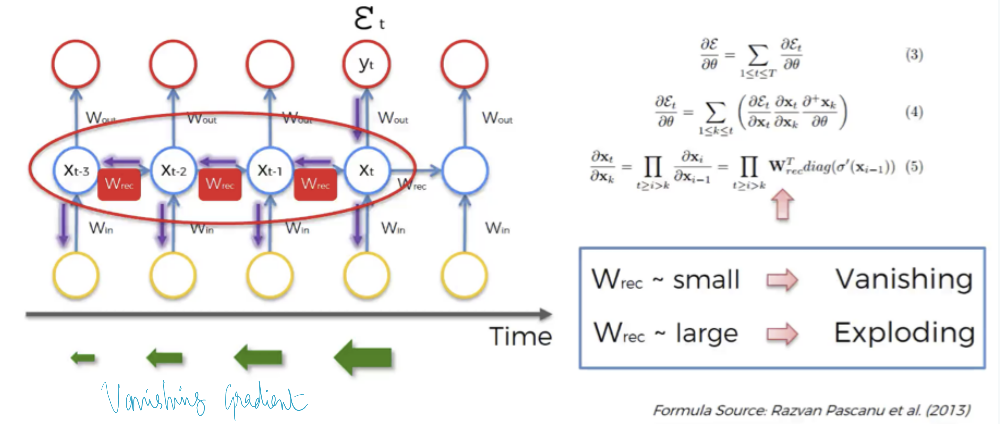
* __Suggested Reading__ On the difficulty of training recurrent neural networks by Razvan Pascanu et al (2013)
https://proceedings.mlr.press/v28/pascanu13.pdf

## Solutions to Vanishing Gradient problem
1. __For Exploding Gradient__

    * __Truncated Backpropagation:__ stop backpropagating after a certain time, but that is suboptimal because not all weights are being updated. On the other hand if we don't stop, we'd end up having a completely irrelevant network
    * __Penalties:__ Gradient being penalised and artificially reduced
    * __Gradient Clipping:__ setting a maximum limit for the gradient
    
2: __For Vanishing Gradient__

   * __Weight Initialisation:__ being smart about initial weights to minimise vanishing gradient
   * __Echo State Networks:__ The main idea is (i) to drive a random, large, fixed recurrent neural network with the input signal, thereby inducing in each neuron within this "reservoir" network a nonlinear response signal, and (ii) combine a      desired output signal by a trainable linear combination of all of these response signals
    * __Long Short-Term Memory Networks (LSTMs)__ make W rec = 1
   

  

# 5. Long Short-Term Memory (LSTM)
1. __Vanishing Gradient Problem__: As we propagate the error through the network, it has to through the unravelled temporal loop, through layers of hidden neurons connected to themselves via recurrent weight (W rec). W rec declines rapidly and weights on the hidden layers on far left are updated much slower than the layers on right. This is a problem because weights of far-left dictate the output of those layers, and these layers in turn are the inputs to the far-right hidden neuron layers. As a result the training of whole network suffers.

2. __Suggested Reading__ https://colah.github.io/posts/2015-08-Understanding-LSTMs/ & https://blog.mlreview.com/understanding-lstm-and-its-diagrams-37e2f46f1714

3. This is how LSTM is normally represented 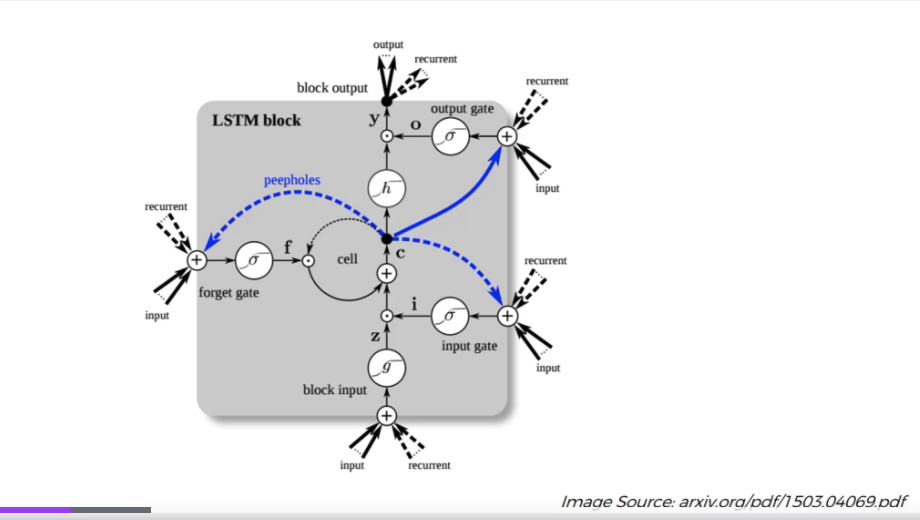

4. Below is a simpler representation of LSTM. The main point is the pipeline at top (memory cell, where we make W rec = 1). It flows freely through time. Sometimes it might be removed/erased or operations performed on it. This memory cell helps solve the Vanishing Gradient problem 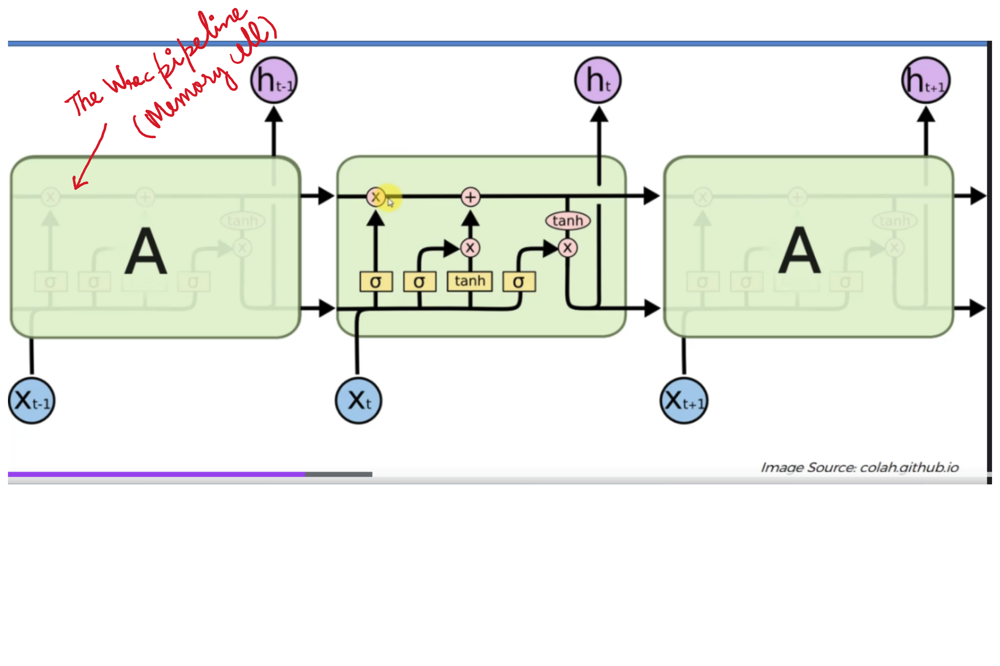

5. So to an LSTM individual module, we have 3 vector inputs and 2 vector outputs. When visualising concatenation, imagine two vector inputs from pipes running in parallel to each other.
    * Vector coming from previous node (h t-1) and input (Xt) are combined to decide whether the forget valve should go on or off, via the first sigmoid activation function.
    * These two vectors are also passed through another sigmoid activation function to decide whether the memory valve should accept them and tanh decides what value to accept.
    * On top we have the memory cell pipeline, to which inputs from forget valve, memory valve and additional memory (if needed) flow and are updated throughout.
    * The input vectors are also passed through a third sigmoid activation function and then the output valve, to decide what part of the memory pipeline is going to become output. 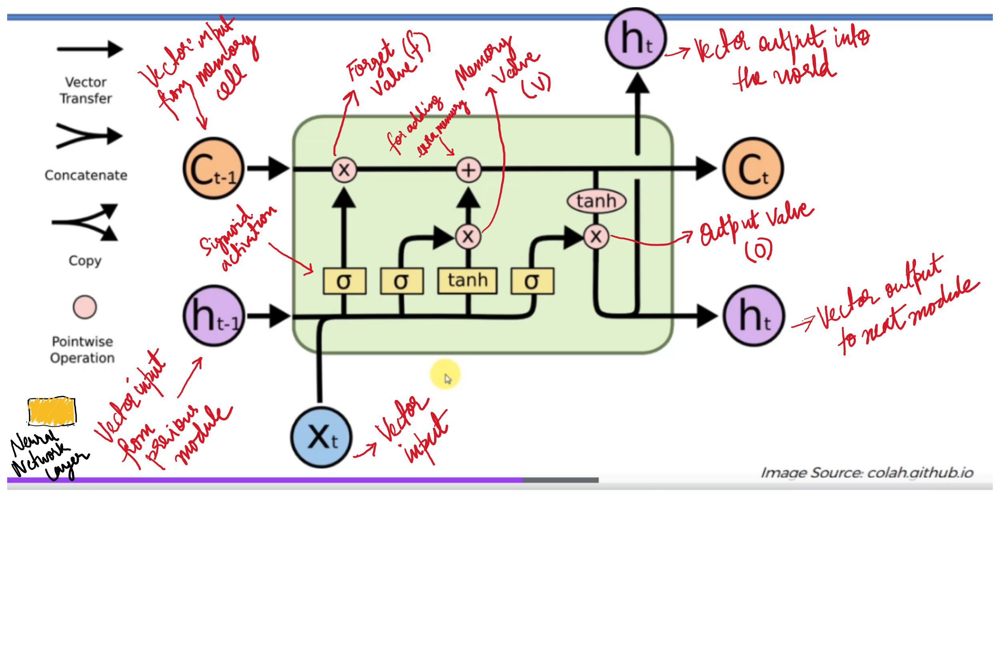

# 6. LSTM Practical Application
* Visualising and understanding Recurrent Networks byy Andrej Karpathy https://arxiv.org/pdf/1506.02078.pdf
* The unreasonable effectiveness of recurrent neural networks by Andrej Karpathy https://karpathy.github.io/2015/05/21/rnn-effectiveness/

# 7. LSTM Variations
1. __Adding Peepholes__ Allows the memory valve and the output valve to make use of information in memory pipeline to make a decision
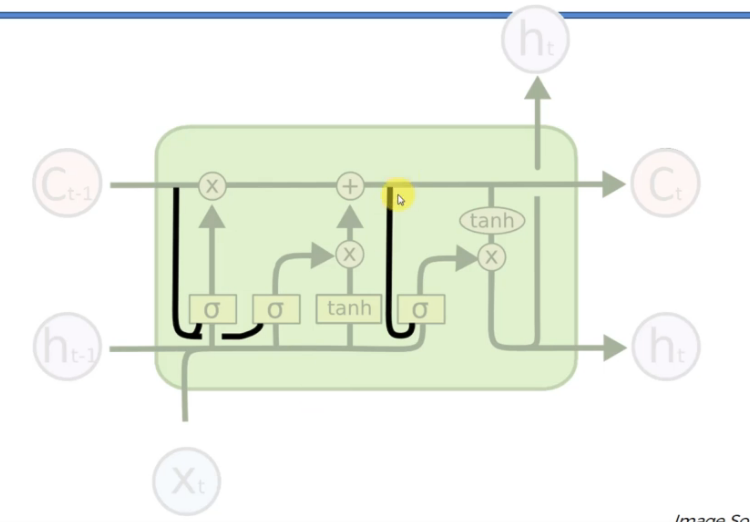
2. __Modification #2__ Connecting forget valve and memory valve directly. Instead of letting memory valve make an isolated decision, now the decision is a combined one 
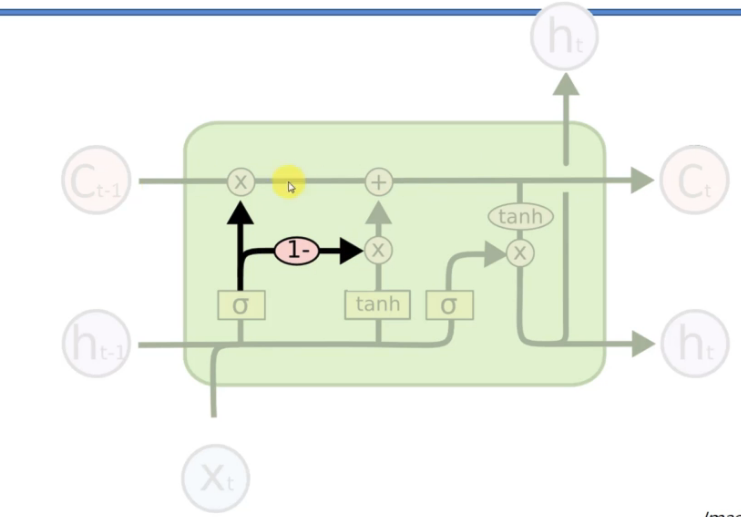
### 3.__Gated Recurring Units (GRU)__ they completely get rid of the memory pipeline (C), and replace it with h (the hidden pipeline). So now instead of two separate values for memory and hidden state, now we have just one. It simplifies things, but is probably a bit inflexible 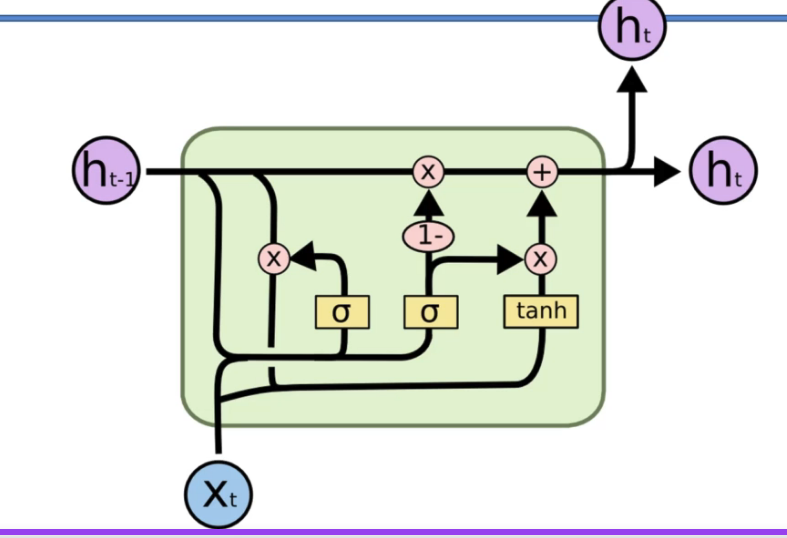
4. __Suggested Reading__ LSTM: A Search Space Odyssey by Klaus Greff et al (2015) https://arxiv.org/pdf/1503.04069.pdf